In [1]:
import os
os.chdir('/workspace/my_cyclegan/metric/')

In [2]:
!python calc_metrics.py --input_path /all_data/Scannet_ssim/testA/full_size/depth/\
--pred_path /workspace/results/train_Lap/test/A2B/depth/\
--target_path /all_data/Scannet_ssim/testB/full_size/depth/

start
100%|█████████████████████████████████████████| 501/501 [01:14<00:00,  6.71it/s]
{'rmse': 75.89312580926038, 'mae': 22.626864182951973, 'rmse_h': 165.56608820446635, 'rmse_d': 58.23744615235843, 'psnr': 39.69458352059752, 'ssim': 0.9843965187838036, 'mae_h': 92.73287605621098, 'mae_d': 15.915835594066184, 'mse_v': 0.07735393843598415}


In [4]:
import matplotlib.pyplot as plt
import imageio
import os
import numpy as np
import torch
from glob import glob

In [5]:
def coords_to_normals(coords):
    coords = torch.as_tensor(coords)
    if coords.ndim < 4:
        coords = coords[None]

    dxdu = coords[..., 0, :, 1:] - coords[..., 0, :, :-1]
    dydu = coords[..., 1, :, 1:] - coords[..., 1, :, :-1]
    dzdu = coords[..., 2, :, 1:] - coords[..., 2, :, :-1]
    dxdv = coords[..., 0, 1:, :] - coords[..., 0, :-1, :]
    dydv = coords[..., 1, 1:, :] - coords[..., 1, :-1, :]
    dzdv = coords[..., 2, 1:, :] - coords[..., 2, :-1, :]

    dxdu = torch.nn.functional.pad(dxdu, (0, 1),       mode='replicate')
    dydu = torch.nn.functional.pad(dydu, (0, 1),       mode='replicate')
    dzdu = torch.nn.functional.pad(dzdu, (0, 1),       mode='replicate')

    # pytorch cannot just do `dxdv = torch.nn.functional.pad(dxdv, (0, 0, 0, 1), mode='replicate')`, so
    dxdv = torch.cat([dxdv, dxdv[..., -1:, :]], dim=-2)
    dydv = torch.cat([dydv, dydv[..., -1:, :]], dim=-2)
    dzdv = torch.cat([dzdv, dzdv[..., -1:, :]], dim=-2)

    n_x = dydv * dzdu - dydu * dzdv
    n_y = dzdv * dxdu - dzdu * dxdv
    n_z = dxdv * dydu - dxdu * dydv

    n = torch.stack([n_x, n_y, n_z], dim=-3)
    n = torch.nn.functional.normalize(n, dim=-3)
    return n

def depth_to_absolute_coordinates(depth, depth_type, K, shift):

    depth = torch.as_tensor(depth)
    dtype = depth.dtype
    h, w = depth.shape[-2:]
    K = torch.as_tensor(K, dtype=dtype)

    v, u = torch.meshgrid(torch.arange(h, dtype=dtype) + shift, torch.arange(w, dtype=dtype) + shift)
    if depth.ndim < 3:  # ensure depth has channel dimension
        depth = depth[None]
    ones = torch.ones_like(v)
    points = torch.einsum('lk,kij->lij', K.inverse(), torch.stack([u, v, ones]))
    if depth_type == 'perspective':
        points = torch.nn.functional.normalize(points, dim=-3)
        points = points.to(depth) * depth
    elif depth_type == 'orthogonal':
        points = points / points[2:3]
        points = points.to(depth) * depth
    else:
        raise ValueError(f'Unknown type {depth_type}')
    return points

In [9]:
path_raw = '/all_data/Scannet_ssim/testA/full_size/depth/'
path_render = '/all_data/Scannet_ssim/testB/full_size/depth/'
path_img = '/all_data/Scannet_ssim/testA/full_size/img/'
path_pred_1 = '/workspace/results/train_Lap/test/A2B/depth/'
path_pred_2 = '/workspace/results/test_pretrain_Lap/test/A2B/depth/'
vis_scene = ['scene0320_01_100', 'scene0507_00_900', 'scene0406_02_800', 'scene0213_00_1800', 'scene0331_00_1600']
raw = [imageio.imread(os.path.join(path_raw, scene+'.png')) for scene in vis_scene]
render = [imageio.imread(os.path.join(path_render, scene+'.png'))[0::2,0::2] for scene in vis_scene]
pred1 = [imageio.imread(os.path.join(path_pred_1, scene+'.png')) for scene in vis_scene]
pred2 = [imageio.imread(os.path.join(path_pred_2, scene+'.png')) for scene in vis_scene]
img = [imageio.imread(os.path.join(path_img, scene+'.jpg')) for scene in vis_scene]
K = [np.loadtxt(os.path.join('/all_data/Scannet/', scene[:12], 'intrinsic', 'intrinsic_depth.txt'))[:3,:3] for scene in vis_scene]

In [ ]:
# vis_scene = ['scene0320_01_100', 'scene0507_00_900', 'scene0406_02_800', 'scene0213_00_1800', 'scene0331_00_1600']

# N = len(vis_scene)
# fig, ax = plt.subplots(N, 4, figsize=(16, 3 * N))
# fig.patch.set_alpha(1.0)
   
# for row, scene in enumerate(vis_scene):
#     fname = scene + ".jpg"
#     fpath = os.path.join("/all_data/Scannet_ssim/testA/full_size/img", fname)
#     ax[row, 0].imshow(imageio.imread(fpath), cmap=plt.get_cmap('RdYlBu'))
#     ax[row, 0].set_title('real image')
    
#     fname = scene + ".png"
#     fpath = os.path.join("/all_data/Scannet_ssim/testA/full_size/depth", fname)
#     real_depth = imageio.imread(fpath)
#     ax[row, 1].imshow(real_depth, cmap=plt.get_cmap('RdYlBu'), vmin=0, vmax=5100)
#     ax[row, 1].set_title('real depth')
    
#     fpath = os.path.join('/workspace/results/new_norm/test/A2B/depth/', fname)
#     pred_depth = imageio.imread(fpath)
#     ax[row, 2].imshow(pred_depth, cmap=plt.get_cmap('RdYlBu'), vmin=0, vmax=5100)
#     ax[row, 2].set_title('pred depth')
    
#     fpath = os.path.join("/all_data/Scannet_ssim/testB/full_size/depth", fname)
#     render_depth = imageio.imread(fpath)
#     ax[row, 3].imshow(render_depth, cmap=plt.get_cmap('RdYlBu'), vmin=0, vmax=5100)
#     ax[row, 3].set_title('render depth')
# plt.tight_layout()
# plt.savefig('val_res.png')

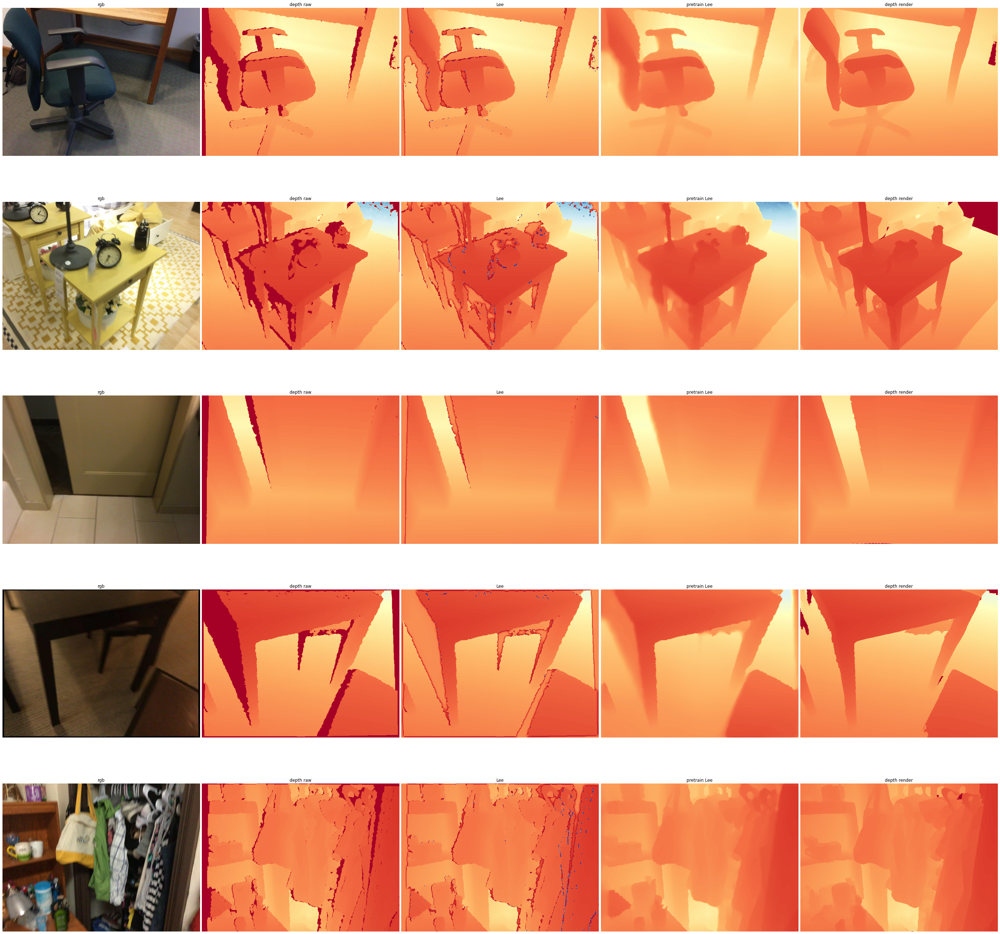

In [10]:
fig, axes = plt.subplots(len(vis_scene), 5, figsize=(50,50))
fig.subplots_adjust(hspace=0.0, wspace=0.01)
for i,ax in enumerate(axes.flatten()):
    ax.axis('off')
for i in range(len(vis_scene)):
    axes[i,0].set_title('rgb')
    axes[i,1].set_title('depth raw')
    axes[i,2].set_title('Lee')
    axes[i,3].set_title('pretrain Lee')
    axes[i,4].set_title('depth render')
    axes[i,0].imshow(img[i])
    axes[i,1].imshow(raw[i],cmap=plt.get_cmap('RdYlBu'), vmin=0, vmax=5100)
    axes[i,2].imshow(pred1[i],cmap=plt.get_cmap('RdYlBu'), vmin=0, vmax=5100)
    axes[i,3].imshow(pred2[i],cmap=plt.get_cmap('RdYlBu'), vmin=0, vmax=5100)
    axes[i,4].imshow(render[i],cmap=plt.get_cmap('RdYlBu'), vmin=0, vmax=5100)

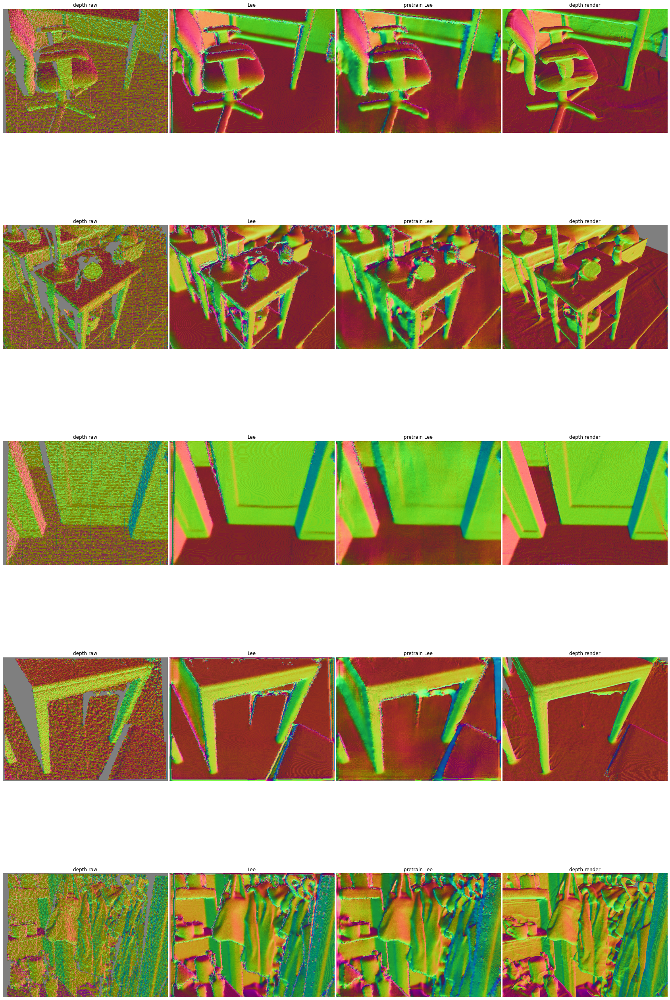

In [11]:
fig, axes = plt.subplots(len(vis_scene), 4, figsize=(30,50))
fig.subplots_adjust(hspace=0.0, wspace=0.01)
for i,ax in enumerate(axes.flatten()):
    ax.axis('off')
for i in range(len(vis_scene)):
    axes[i,0].set_title('depth raw')
    axes[i,1].set_title('Lee')
    axes[i,2].set_title('pretrain Lee')
    axes[i,3].set_title('depth render')
    axes[i,0].imshow((coords_to_normals(depth_to_absolute_coordinates(raw[i].astype(np.float64), 'orthogonal',K[i], 0.5))[0].permute(1,2,0).numpy() + 1.) / 2.)
    axes[i,1].imshow((coords_to_normals(depth_to_absolute_coordinates(pred1[i].astype(np.float64), 'orthogonal',K[i], 0.5))[0].permute(1,2,0).numpy() + 1.) / 2.)
    axes[i,2].imshow((coords_to_normals(depth_to_absolute_coordinates(pred2[i].astype(np.float64), 'orthogonal',K[i], 0.5))[0].permute(1,2,0).numpy() + 1.) / 2.)
    axes[i,3].imshow((coords_to_normals(depth_to_absolute_coordinates(render[i].astype(np.float64), 'orthogonal',K[i], 0.5))[0].permute(1,2,0).numpy() + 1.) / 2.)

In [18]:
!python fid_kid.py  /workspace/results/max/cycle_B/test/A2B/ /all_data/Scannet_filtered/testB/ --batch-size 50 --gpu 1 --mmd-var

start
loading network Tensorflow
Network loaded
compute statistic A
100%|█████████████████████████████████████████| 208/208 [01:08<00:00,  3.05it/s]
compute statistic B
100%|█████████████████████████████████████████| 208/208 [01:11<00:00,  2.92it/s]
compute FID
FID:  29.62166218771796
MMD: 100%|█████████████████████████| 50/50 [00:13<00:00,  3.67it/s, mean=0.0147]
mean MMD^2 estimate: 1.4719505140713895
std MMD^2 estimate: 0.0008865415728018759
MMD^2 estimates:
[0.01456185 0.01503379 0.01448186 0.01514272 0.01333263 0.01466866
 0.01490709 0.01370897 0.01478659 0.01571269 0.01529045 0.01385495
 0.01508523 0.01418363 0.01368535 0.0151058  0.01444215 0.01502514
 0.01464301 0.01342552 0.0143904  0.01482912 0.01510059 0.01485338
 0.01366118 0.01740106 0.01475237 0.01357291 0.01640912 0.01511938
 0.0145042  0.01692432 0.01409718 0.01310484 0.01530119 0.01472808
 0.01373091 0.01309347 0.01406001 0.01428108 0.01524683 0.01504093
 0.01476945 0.01510843 0.01590046 0.01372041 0.01573417 0.0150201

## Scannet and Scannet